
# WiDS Datathon Challenge 1 
### by WiDS San Diego First time Kagglers / Students
### last updated February 3, 2024


# The Objective: 
## The task is to assess whether the likelihood of the patient’s Diagnosis Period being less than 90 days is predictable using these characteristics and information about the patient. Ultimately, we want to uncover any issues of equity in metastatic breast cancer diagnosis.

## Begin with Exploratory Data Analysis

In [102]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [103]:
# Read the dataset in and convert it into a pandas DataFrame

data = pd.read_csv('training.csv')

In [104]:
data.head()

,patient_id,patient_race,payer_type,patient_state,patient_zip3,patient_age,patient_gender,bmi,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,...,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Ozone,PM25,N02,DiagPeriodL90D
0,475714,NaN,MEDICAID,CA,924,84,F,NaN,C50919,Malignant neoplasm of unsp site of unspecified...,...,12.871429,22.542857,10.100000,27.814286,11.200000,3.500000,52.237210,8.650555,18.606528,1
1,349367,White,COMMERCIAL,CA,928,62,F,28.49,C50411,Malig neoplm of upper-outer quadrant of right ...,...,8.957576,10.109091,8.057576,30.606061,7.018182,4.103030,42.301121,8.487175,20.113179,1
2,138632,White,COMMERCIAL,TX,760,43,F,38.09,C50112,Malignant neoplasm of central portion of left ...,...,11.253333,9.663333,3.356667,31.394915,15.066667,7.446667,40.108207,7.642753,14.839351,1
3,617843,White,COMMERCIAL,CA,926,45,F,NaN,C50212,Malig neoplasm of upper-inner quadrant of left...,...,8.845238,8.688095,5.280952,27.561905,4.404762,4.809524,42.070075,7.229393,15.894123,0
4,817482,NaN,COMMERCIAL,ID,836,55,F,NaN,1749,"Malignant neoplasm of breast (female), unspeci...",...,15.276000,11.224000,1.946000,26.170213,12.088000,13.106000,41.356058,4.110749,11.722197,0


In [105]:
data.size

1071198

In [106]:
data.shape

(12906, 83)

In [107]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12906 entries, 0 to 12905
Data columns (total 83 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   patient_id                             12906 non-null  int64  
 1   patient_race                           6521 non-null   object 
 2   payer_type                             11103 non-null  object 
 3   patient_state                          12855 non-null  object 
 4   patient_zip3                           12906 non-null  int64  
 5   patient_age                            12906 non-null  int64  
 6   patient_gender                         12906 non-null  object 
 7   bmi                                    3941 non-null   float64
 8   breast_cancer_diagnosis_code           12906 non-null  object 
 9   breast_cancer_diagnosis_desc           12906 non-null  object 
 10  metastatic_cancer_diagnosis_code       12906 non-null  object 
 11  me

In [108]:
data["patient_gender"].unique()

array(['F'], dtype=object)

In [109]:
# Get descriptive stats for the target variable
data['DiagPeriodL90D'].describe()

count    12906.000000
mean         0.624516
std          0.484266
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: DiagPeriodL90D, dtype: float64

In [110]:
# How many outcomes are there? Is there class imbalance?
data['DiagPeriodL90D'].value_counts(normalize=True)*100

1    62.451573
0    37.548427
Name: DiagPeriodL90D, dtype: float64

### The target variable has binary outcomes - whether the patient was diagnosed within 90 days or not. There is some mild class imbalance, where Yes occurs more frequently than No at 62.45% of the observations. However, this is not severe enough to require or warrant treatment at this point.

# Perform Cleaning and Validation

In [111]:
# Check for missing values
data.isna().sum()

patient_id           0
patient_race      6385
payer_type        1803
patient_state       51
patient_zip3         0
                  ... 
veteran              1
Ozone               29
PM25                29
N02                 29
DiagPeriodL90D       0
Length: 83, dtype: int64

# Phase I: Feature Engineering

## Feature Selection: XGBoost for Feature Importances

   ### XGBoost can handle missing values and give great results. 

   ### Given the complexity of the dataset, we can apply this method to narrow down the number of dimensions so all that's left is the group of columns with the most predictive power over the outcome we are interested in. Not every variable is a strong predictor. So, the goal here is to reduce the complexity of our modeling efforts while maintaining interpretability and explanatory power.

   ### Cleaning, validation, and EDA will continue after we select our most important predictive model features.

In [112]:
# Import libraries

from xgboost import XGBClassifier
from xgboost import plot_importance

from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score,\
f1_score, confusion_matrix, ConfusionMatrixDisplay, RocCurveDisplay

import pickle

## Pre-processing

In [113]:
# Drop columns that are not needed
prepped_data = data.drop(['patient_id', 'patient_race', 'bmi', 
                          'metastatic_first_novel_treatment', 
                          'metastatic_first_novel_treatment_type', 
                          'patient_gender', 'female', 'male'], axis=1)
prepped_data.head()

,payer_type,patient_state,patient_zip3,patient_age,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,metastatic_cancer_diagnosis_code,Region,Division,population,...,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Ozone,PM25,N02,DiagPeriodL90D
0,MEDICAID,CA,924,84,C50919,Malignant neoplasm of unsp site of unspecified...,C7989,West,Pacific,31437.75000,...,12.871429,22.542857,10.100000,27.814286,11.200000,3.500000,52.237210,8.650555,18.606528,1
1,COMMERCIAL,CA,928,62,C50411,Malig neoplm of upper-outer quadrant of right ...,C773,West,Pacific,39121.87879,...,8.957576,10.109091,8.057576,30.606061,7.018182,4.103030,42.301121,8.487175,20.113179,1
2,COMMERCIAL,TX,760,43,C50112,Malignant neoplasm of central portion of left ...,C773,South,West South Central,21996.68333,...,11.253333,9.663333,3.356667,31.394915,15.066667,7.446667,40.108207,7.642753,14.839351,1
3,COMMERCIAL,CA,926,45,C50212,Malig neoplasm of upper-inner quadrant of left...,C773,West,Pacific,32795.32558,...,8.845238,8.688095,5.280952,27.561905,4.404762,4.809524,42.070075,7.229393,15.894123,0
4,COMMERCIAL,ID,836,55,1749,"Malignant neoplasm of breast (female), unspeci...",C773,West,Mountain,10886.26000,...,15.276000,11.224000,1.946000,26.170213,12.088000,13.106000,41.356058,4.110749,11.722197,0


In [114]:
# Dummy encode categoricals
encoded_data = pd.get_dummies(prepped_data, drop_first='True')
encoded_data.head()

,patient_zip3,patient_age,population,density,age_median,age_under_10,age_10_to_19,age_20s,age_30s,age_40s,...,Region_South,Region_West,Division_East South Central,Division_Middle Atlantic,Division_Mountain,Division_New England,Division_Pacific,Division_South Atlantic,Division_West North Central,Division_West South Central
0,924,84,31437.75000,1189.562500,30.642857,16.014286,15.542857,17.614286,14.014286,11.614286,...,0,1,0,0,0,0,1,0,0,0
1,928,62,39121.87879,2295.939394,38.200000,11.878788,13.354545,14.230303,13.418182,13.333333,...,0,1,0,0,0,0,1,0,0,0
2,760,43,21996.68333,626.236667,37.906667,13.028333,14.463333,12.531667,13.545000,12.860000,...,1,0,0,0,0,0,0,0,0,1
3,926,45,32795.32558,1896.220930,42.871429,10.071429,12.135714,12.538095,12.464286,12.650000,...,0,1,0,0,0,0,1,0,0,0
4,836,55,10886.26000,116.886000,43.473469,10.824000,13.976000,9.492000,10.364000,12.600000,...,0,1,0,0,1,0,0,0,0,0


In [115]:
# Split the data for model

# Define the target variable
y = encoded_data['DiagPeriodL90D']

# Define the predictor variables
X = encoded_data.copy()
X = X.drop('DiagPeriodL90D', axis=1)

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, stratify=y, random_state=42)

# Keep feature names
feature_names = X_train.columns 


## Modeling for Feature Selection
### Cross-validated hyperparameter tuning

In [74]:
# Instantiate the classifier
#xbg = XGBClassifier(objective='binary:logistic', random_state=42)

#cv_params = {'max_depth': [4, 5, 6, 7, 8],
             'min_child_weight': [1, 2, 3, 4, 5], 
             'learning_rate': [0.1, 0.2, 0.3],
             'n_estimators': [75, 100, 125]}

#scoring = {'accuracy', 'precision', 'recall', 'f1'}

#xgb_cv = GridSearchCV(xbg, cv_params, scoring=scoring, cv=5, refit='f1')

In [75]:
%%time

#xgb_cv.fit(X_train, y_train)

CPU times: user 8h 54min 48s, sys: 2min 35s, total: 8h 57min 23s
Wall time: 33min 57s


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=42, ...),
             param_grid={'learning_rate': [0.1, 0.2, 0.3],
                         'max_depth': [4, 5, 6, 7, 8],
                         'min_child_weight': [1, 2, 3, 4, 5],
                         'n_estimators': [75, 100, 125]},
             refit='f1', scoring={'recall', 'accuracy', 'f1', 'precision'})

## Pickle the model

In [77]:
# Get current working directory to set file path
import os
os.getcwd()

'/Users/bethelhagos/Women in Data Science 2024 Datathon Challenge: Equity in Healthcare'

In [116]:
path = '/Users/bethelhagos/Women in Data Science 2024 Datathon Challenge: Equity in Healthcare'

In [101]:
pip install scikit-learn==1.4.0

  Obtaining dependency information for scikit-learn==1.4.0 from https://files.pythonhosted.org/packages/b2/48/ebff4e2b434865737d95b85366b339c0bf16c5865ab6f314bb0f28cbb695/scikit_learn-1.4.0-1-cp311-cp311-macosx_10_9_x86_64.whl.metadata
  Using cached scikit_learn-1.4.0-1-cp311-cp311-macosx_10_9_x86_64.whl.metadata (11 kB)
Using cached scikit_learn-1.4.0-1-cp311-cp311-macosx_10_9_x86_64.whl (11.5 MB)
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.4.1.post1
    Uninstalling scikit-learn-1.4.1.post1:
      Successfully uninstalled scikit-learn-1.4.1.post1
Note: you may need to restart the kernel to use updated packages.


In [79]:
#Pickle the model

#with open(path + 'xgb_cv_model.pickle', 'wb') as to_write:
#    pickle.dump(xgb_cv, to_write) 

In [ ]:
# Run this to open pickled model

with open(path+'xgb_cv_model.pickle', 'rb') as to_read:
    xgb_cv = pickle.load(to_read)

In [ ]:
# Open pickled model
#with open(path +'xgb_cv_model.pickle', 'rb') as to_read:
#    xgb_cv = pickle.load(to_read)
    
#xgb_cv.fit(X_train, y_train)

#print('F1 score XGB CV: ', xgb_cv.best_score_)

In [86]:
# Make a helper function to store results

def make_results(model_name, model_object):
    '''
    Takes model name and a fit GridSearchCV model object, 
    then makes a pandas dataframe with the best estimator (best mean f1 across all validation folds),
    returns f1, recall, precision, and accuracy scores
    '''
    # get results and put in df
    cv_results = pd.DataFrame(model_object.cv_results_)
    
    # get the row with the max mean f11 score
    best_estimator_results = cv_results.iloc[cv_results['mean_test_f1'].idxmax(), :]
    
    # extract accuracy, precision, recall, and f1 score from that row
    f1 = best_estimator_results.mean_test_f1
    recall = best_estimator_results.mean_test_recall
    precision = best_estimator_results.mean_test_precision
    accuracy = best_estimator_results.mean_test_accuracy
    
    # create a table of results
    table = pd.DataFrame({'Model': [model_name],
                         'F1': [f1],
                         'Recall': [recall],
                         'Precision': [precision],
                         'Accuracy': [accuracy]})
    return table

In [87]:
# Create xgb model results table

xgb_cv_results = make_results('XGBoost CV', xgb_cv)
xgb_cv_results

,Model,F1,Recall,Precision,Accuracy
0,XGBoost CV,0.865323,0.96493,0.784388,0.812377


## Predict on test data

In [89]:
xgb_cv_pred = xgb_cv.predict(X_test)
print('F1 score final XGB model: ', f1_score(y_test, xgb_cv_pred))
print('Recall score final XGB model: ', recall_score(y_test, xgb_cv_pred))
print('Precision score final XGB model: ', precision_score(y_test, xgb_cv_pred))
print('Accuracy score final XGB model: ', accuracy_score(y_test, xgb_cv_pred))

F1 score final XGB model:  0.8570793509668815
Recall score final XGB model:  0.9568238213399504
Precision score final XGB model:  0.7761674718196457
Accuracy score final XGB model:  0.8007437248218159


## Confusion matrix

In [90]:
# Define a helper function to plot confusion matrix

def conf_matrix_plot(model, x_data, y_data):
    '''
    Takes model object, x data (test or val), and y data (test or val),
    returns a plot of confusion matrix for predictions on y data
    '''
    model_pred = model.predict(x_data)
    cm = confusion_matrix(y_data, model_pred, labels=model.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels = model.classes_)
    
    disp.plot()
    plt.show()

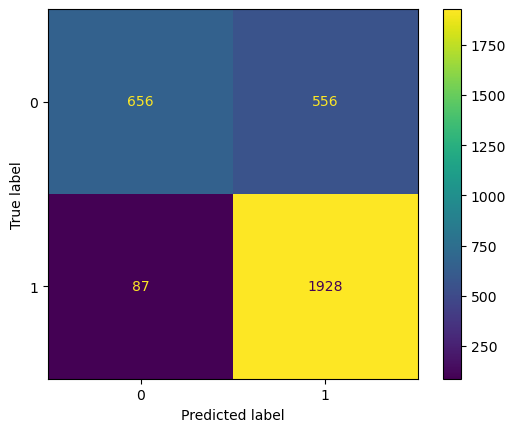

In [91]:
conf_matrix_plot(xgb_cv, X_test, y_test)

## Get feature Importances for Feature Selection

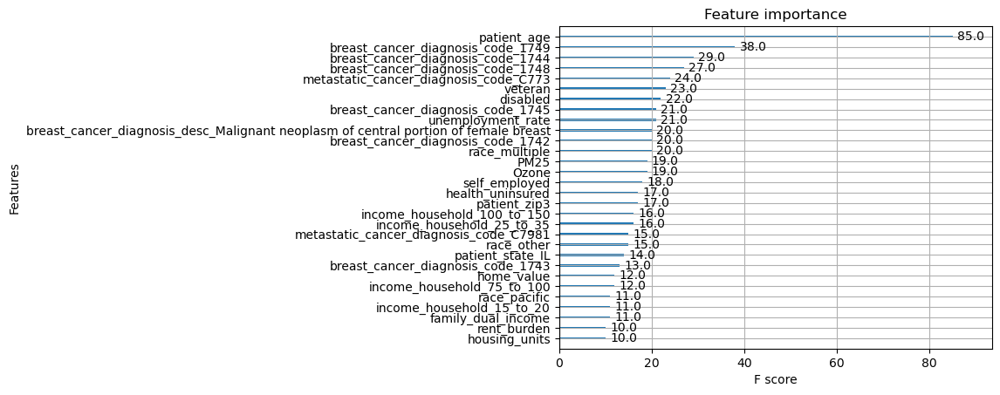

In [116]:
#plt.figure(figsize=(20,80))
plot_importance(xgb_cv.best_estimator_, max_num_features = 30);

In [117]:
# Make a new DataFrame that only has the most predictive variables selected
top20_features_subset = encoded_data[['DiagPeriodL90D','patient_age', 'breast_cancer_diagnosis_code_1749', 'breast_cancer_diagnosis_code_1744', 'breast_cancer_diagnosis_code_1748', 'metastatic_cancer_diagnosis_code_C773','veteran', 'disabled', 'breast_cancer_diagnosis_code_1745', 'unemployment_rate', 'breast_cancer_diagnosis_desc_Malignant neoplasm of central portion of female breast', 'breast_cancer_diagnosis_code_1742', 'race_multiple', 'PM25', 'Ozone', 'self_employed','health_uninsured', 'patient_zip3', 'income_household_100_to_150', 'income_household_25_to_35', 'metastatic_cancer_diagnosis_code_C7981']]
top20_features_subset

,DiagPeriodL90D,patient_age,breast_cancer_diagnosis_code_1749,breast_cancer_diagnosis_code_1744,breast_cancer_diagnosis_code_1748,metastatic_cancer_diagnosis_code_C773,veteran,disabled,breast_cancer_diagnosis_code_1745,unemployment_rate,...,breast_cancer_diagnosis_code_1742,race_multiple,PM25,Ozone,self_employed,health_uninsured,patient_zip3,income_household_100_to_150,income_household_25_to_35,metastatic_cancer_diagnosis_code_C7981
0,1,84,0,0,0,0,3.500000,12.871429,0,8.471429,...,0,8.757143,8.650555,52.237210,13.428571,11.200000,924,11.571429,10.142857,0
1,1,62,0,0,0,1,4.103030,8.957576,0,5.103030,...,0,10.081818,8.487175,42.301121,15.224242,7.018182,928,19.760606,5.163636,0
2,1,43,0,0,0,1,7.446667,11.253333,0,4.560000,...,0,6.898333,7.642753,40.108207,13.722034,15.066667,760,20.875000,6.763333,0
3,0,45,0,0,0,1,4.809524,8.845238,0,5.264286,...,0,8.611905,7.229393,42.070075,18.502381,4.404762,926,18.850000,4.380952,0
4,0,55,1,0,0,1,13.106000,15.276000,0,4.258000,...,0,6.258000,4.110749,41.356058,13.029545,12.088000,836,13.620000,11.462000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12901,1,50,0,0,0,1,6.247059,17.400000,0,9.135294,...,0,6.005882,8.068682,38.753055,9.105882,6.300000,436,10.994118,10.364706,0
12902,1,50,0,0,0,1,5.671605,11.243210,0,5.332099,...,0,9.274074,6.265266,36.469947,14.116250,3.845679,945,18.003750,5.148750,0
12903,1,61,0,0,0,0,4.809524,8.845238,0,5.264286,...,0,8.611905,7.229393,42.070075,18.502381,4.404762,926,18.850000,4.380952,0
12904,0,37,1,0,0,1,1.755263,10.194737,0,7.184211,...,0,6.089474,7.879795,37.722740,18.145946,6.392105,112,14.889474,7.589474,0


### Correlations & Heat Map

<Axes: >

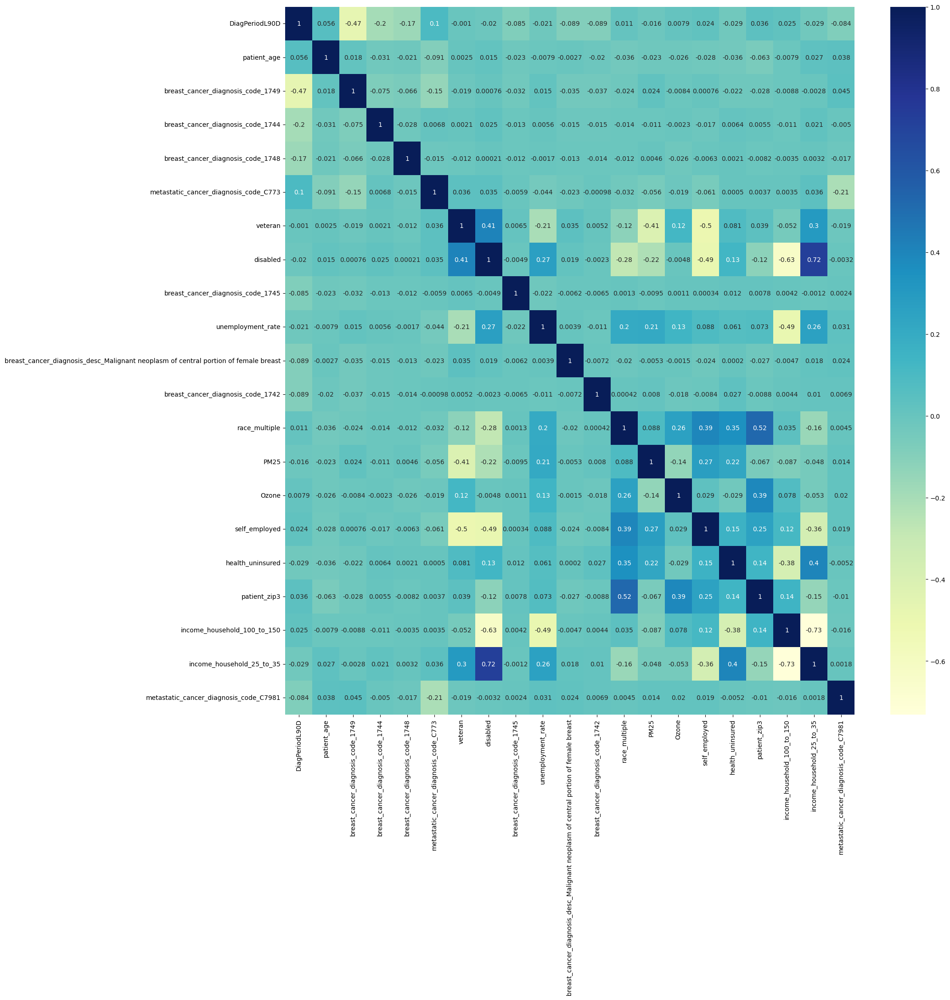

In [118]:
# Visualize the correlations between the most important features
corr = top20_features_subset.corr()
plt.figure(figsize=(20,20))
sns.heatmap(corr, cmap='YlGnBu', annot=True, xticklabels=True, yticklabels=True)

# Phase I: Results
### There is a lot to further unpack, but upon first glance, there is definitely a story of Equity in Healthcare to tell here. 

### It appears that in addition to medical indicators of a patient's cancer and health status, there are a number of potential social determinants of health outcomes; the demographic, environmental, and patient characteristic data is significant in a very strong predictive model of whether or not a patient will receive a potentially life saving 90 day diagnosis. Among the strongest correlations visualized above, we see that household income, disability status, veteran status, race, zipcode, and being uninsured are all factors at play here. These dynamics interconnect, as they are strongly related to eachother. These same variables have negative correlations with whether a patient is diagnosed within that crucial window of time.

### From a modeling standpoint, assumptions of independent variables may need to be tested. In addition, unearthing these relationships could help tell a story, so more EDA is called for.

# Phase II: Use Naive Bayes & Logistic Regression to get 90 Day Diagnosis Probabilities for each patient. Compare models to each other and select the champion

In [25]:
import sklearn
print(sklearn.__version__)

1.1.3


# A. Build and Evaluate a Naive Bayes Model

In [ ]:
## Pre Process - EDA, Cleaning, Feature Transformation, Feature Extraction, etc

In [45]:
# Import libraries & packages
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [46]:
# Look at the dataset, test assumptions and make pre processing decisions
top20_features_subset = encoded_data[['DiagPeriodL90D','patient_age', 'breast_cancer_diagnosis_code_1749', 'breast_cancer_diagnosis_code_1744', 'breast_cancer_diagnosis_code_1748', 'metastatic_cancer_diagnosis_code_C773','veteran', 'disabled', 'breast_cancer_diagnosis_code_1745', 'unemployment_rate', 'breast_cancer_diagnosis_desc_Malignant neoplasm of central portion of female breast', 'breast_cancer_diagnosis_code_1742', 'race_multiple', 'PM25', 'Ozone', 'self_employed','health_uninsured', 'patient_zip3', 'income_household_100_to_150', 'income_household_25_to_35', 'metastatic_cancer_diagnosis_code_C7981']]
top20_features_subset.head()

,DiagPeriodL90D,patient_age,breast_cancer_diagnosis_code_1749,breast_cancer_diagnosis_code_1744,breast_cancer_diagnosis_code_1748,metastatic_cancer_diagnosis_code_C773,veteran,disabled,breast_cancer_diagnosis_code_1745,unemployment_rate,...,breast_cancer_diagnosis_code_1742,race_multiple,PM25,Ozone,self_employed,health_uninsured,patient_zip3,income_household_100_to_150,income_household_25_to_35,metastatic_cancer_diagnosis_code_C7981
0,1,84,0,0,0,0,3.500000,12.871429,0,8.471429,...,0,8.757143,8.650555,52.237210,13.428571,11.200000,924,11.571429,10.142857,0
1,1,62,0,0,0,1,4.103030,8.957576,0,5.103030,...,0,10.081818,8.487175,42.301121,15.224242,7.018182,928,19.760606,5.163636,0
2,1,43,0,0,0,1,7.446667,11.253333,0,4.560000,...,0,6.898333,7.642753,40.108207,13.722034,15.066667,760,20.875000,6.763333,0
3,0,45,0,0,0,1,4.809524,8.845238,0,5.264286,...,0,8.611905,7.229393,42.070075,18.502381,4.404762,926,18.850000,4.380952,0
4,0,55,1,0,0,1,13.106000,15.276000,0,4.258000,...,0,6.258000,4.110749,41.356058,13.029545,12.088000,836,13.620000,11.462000,0


The categorical columns have been one hot encoded, but for our continuous variables let's normalize them to the same scale using min max scaler.

## Check for class imbalance

In [40]:
top20_features_subset['DiagPeriodL90D'].value_counts()

1    8060
0    4846
Name: DiagPeriodL90D, dtype: int64

There is moderate class imbalance but it is not extreme so there is no need to alter the class balance of our target variable.

## Handle Missing Data

In [45]:
top20_features_subset.isnull().sum()

DiagPeriodL90D                                                                          0
patient_age                                                                             0
breast_cancer_diagnosis_code_1749                                                       0
breast_cancer_diagnosis_code_1744                                                       0
breast_cancer_diagnosis_code_1748                                                       0
metastatic_cancer_diagnosis_code_C773                                                   0
veteran                                                                                 1
disabled                                                                                1
breast_cancer_diagnosis_code_1745                                                       0
unemployment_rate                                                                       1
breast_cancer_diagnosis_desc_Malignant neoplasm of central portion of female breast     0
breast_can

In [48]:
print(top20_features_subset.dtypes)

DiagPeriodL90D                                                                           int64
patient_age                                                                              int64
breast_cancer_diagnosis_code_1749                                                        uint8
breast_cancer_diagnosis_code_1744                                                        uint8
breast_cancer_diagnosis_code_1748                                                        uint8
metastatic_cancer_diagnosis_code_C773                                                    uint8
veteran                                                                                float64
disabled                                                                               float64
breast_cancer_diagnosis_code_1745                                                        uint8
unemployment_rate                                                                      float64
breast_cancer_diagnosis_desc_Malignant neoplasm of

In [47]:
top20_features_subset.shape

(12906, 21)

In [50]:
import missingno as msno

<Axes: >

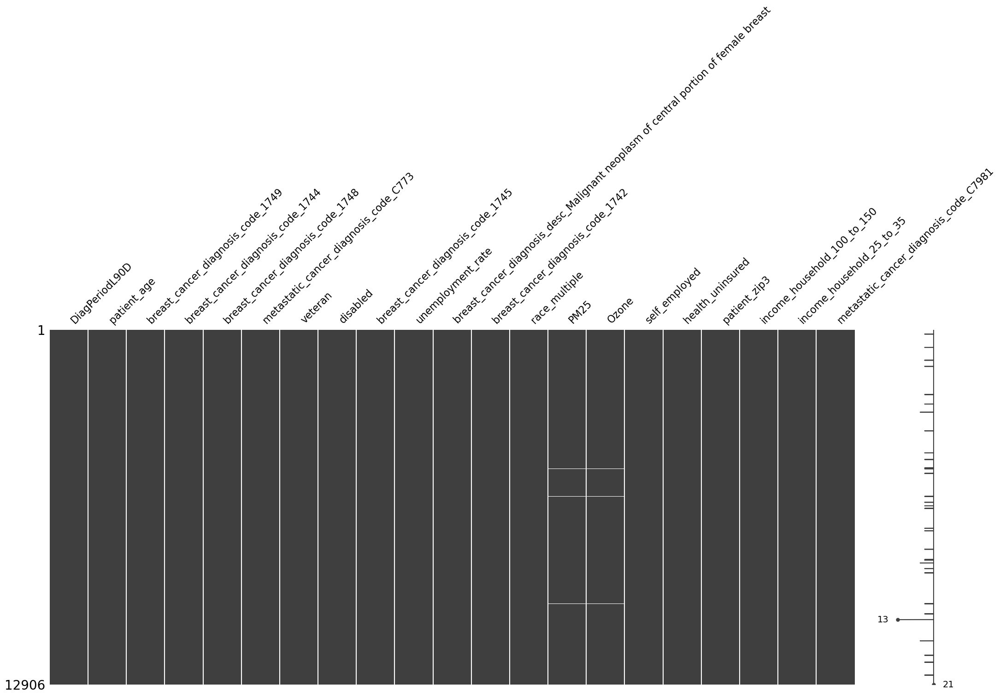

In [51]:
# Missingness matrix
msno.matrix(top20_features_subset)

Considering the total number of observations, in this case, we can just drop the missing data.

In [119]:
top20_features_subset = top20_features_subset.dropna(axis=0)

## Split the data

In [294]:
# Define the target variable
y = top20_features_subset['DiagPeriodL90D']

# Define the predictor variables
X = top20_features_subset.copy()
X = X.drop('DiagPeriodL90D', axis=1)

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify=y, random_state=42)

# Keep feature names
feature_names = X_train.columns 


## Scale the data

In [295]:
# Import the scaler function
from sklearn.preprocessing import MinMaxScaler

# Instantiate the scaler
scaler = MinMaxScaler()

# Fit the scaler to the training data
scaler.fit(X_train)

# Scale the training data
X_train_sc = scaler.transform(X_train)

# Scale the test data
X_test_sc = scaler.transform(X_test)

## Fit the Model & Get predictions

In [296]:
## Fit the Model
gnb_scaled = GaussianNB()
gnb_scaled.fit(X_train_sc, y_train)

# Get the predictions on the test data
scaled_preds = gnb_scaled.predict(X_test_sc)

## Evaluate Model A

In [297]:
## Model Evaluation
print('Accuracy:', '%.3f' % accuracy_score(y_test, scaled_preds))
print('Precision:', '%.3f' % precision_score(y_test, scaled_preds))
print('Recall:', '%.3f' % recall_score(y_test, scaled_preds))
print('F1 Score:', '%.3f' % f1_score(y_test, scaled_preds))

Accuracy: 0.811
Precision: 0.793
Recall: 0.943
F1 Score: 0.861


In [124]:
# Organize results in a table
def create_results_table():
    ''' Creates an empty DF to store model results'''
    return pd.DataFrame(columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score'])

def add_model_results(results_df, model_name, accuracy, precision, recall, f1_score):
    ''' Takes in the model name & results, 
    and returns a new row in the existing df
    '''
    new_row = pd.DataFrame({
        'Model' : [model_name],
        'Accuracy' : [accuracy],
        'Precision' : [precision],
        'Recall' : [recall],
        'F1 Score' : [f1_score]
    })
    results_df = results_df.append(new_row, ignore_index=True)
    return results_df

results_df = create_results_table()

results_df = add_model_results(results_df, 'Model A: Naive Bayes', 0.811, 0.793, 0.943, 0.861)
print(results_df)

                  Model  Accuracy  Precision  Recall  F1 Score
0  Model A: Naive Bayes     0.811      0.793   0.943     0.861


/var/folders/rb/4qzqvc_x3jbczj9trv7ddnjw0000gn/T/ipykernel_33637/1708188469.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append(new_row, ignore_index=True)


The results are impressive! Now let's try another model for comparison and pick the best one for the task at hand.

# B. Build & Evaluate a Decision Tree Model

In [126]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score 
from dmba import plotDecisionTree, classificationSummary, regressionSummary

## Fit the Model & Get predictions

In [271]:
# Instantiate the decision tree classifier
dtree = DecisionTreeClassifier()

# fit the model
dtree.fit(X_train, y_train)

# Get predictions
y_predict = dtree.predict(X_test)

In [65]:
plotDecisionTree(dtree, feature_names=X_train.columns)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.35264 to fit


In [272]:
# Prune/limit size
small_dtree = DecisionTreeClassifier(max_depth=30, min_samples_split=20, min_impurity_decrease=0.01)

# fit the model
small_dtree.fit(X_train, y_train)

# Get predictions
y_predict = small_dtree.predict(X_test)

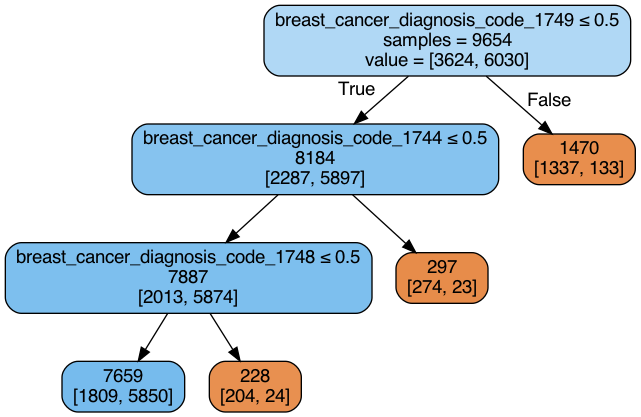

In [273]:
plotDecisionTree(small_dtree, feature_names=X_train.columns)

Logically, this is sound; it makes sense these clinical observations of tumor in breast tissue would top the list of predictors of a timely diagnosis. Let's go deeper.

## Evaluate Model B

In [135]:
## Model Evaluation
print('Accuracy:', '%.3f' % accuracy_score(y_test, y_predict))
print('Precision:', '%.3f' % precision_score(y_test, y_predict))
print('Recall:', '%.3f' % recall_score(y_test, y_predict))
print('F1 Score:', '%.3f' % f1_score(y_test, y_predict))

Accuracy: 0.795
Precision: 0.766
Recall: 0.968
F1 Score: 0.855


In [136]:
results_df = add_model_results(results_df, 'Model B: Decision Tree', 0.695, 0.754, 0.759, 0.757)
print(results_df)

                    Model  Accuracy  Precision  Recall  F1 Score
0    Model A: Naive Bayes     0.811      0.793   0.943     0.861
1  Model B: Decision Tree     0.695      0.754   0.759     0.757


/var/folders/rb/4qzqvc_x3jbczj9trv7ddnjw0000gn/T/ipykernel_33637/1708188469.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append(new_row, ignore_index=True)


# C. Build & Evaluate a Random Forest Model

In [137]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

## Fit the Model & Get predictions

In [138]:
# Try random forest
rf = RandomForestClassifier(n_estimators=100,max_depth=6)

# Fit the model
rf.fit(X_train, y_train)

# Get predictions
y_predictions = rf.predict(X_test)

## Evaluate Model C

In [140]:
## Model Evaluation
print('Accuracy:', '%.3f' % accuracy_score(y_test, y_predictions))
print('Precision:', '%.3f' % precision_score(y_test, y_predictions))
print('Recall:', '%.3f' % recall_score(y_test, y_predictions))
print('F1 Score:', '%.3f' % f1_score(y_test, y_predictions))

Accuracy: 0.811
Precision: 0.783
Recall: 0.965
F1 Score: 0.864


In [141]:
results_df = add_model_results(results_df, 'Model C: Random Forest', 0.786, 0.759, 0.964, 0.849)
print(results_df)

                    Model  Accuracy  Precision  Recall  F1 Score
0    Model A: Naive Bayes     0.811      0.793   0.943     0.861
1  Model B: Decision Tree     0.695      0.754   0.759     0.757
2  Model C: Random Forest     0.786      0.759   0.964     0.849


/var/folders/rb/4qzqvc_x3jbczj9trv7ddnjw0000gn/T/ipykernel_33637/1708188469.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append(new_row, ignore_index=True)


# D. Build & Evaluate a Logistic Regression Model

In [96]:
# pip install --upgrade scikit-learn

  Obtaining dependency information for scikit-learn from https://files.pythonhosted.org/packages/ce/41/5d882544fddba1ae476c240cdf4499743ea84bfeb54456d472966dc86355/scikit_learn-1.4.1.post1-cp311-cp311-macosx_10_9_x86_64.whl.metadata
  Using cached scikit_learn-1.4.1.post1-cp311-cp311-macosx_10_9_x86_64.whl.metadata (11 kB)
Using cached scikit_learn-1.4.1.post1-cp311-cp311-macosx_10_9_x86_64.whl (11.6 MB)
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.4.0
    Uninstalling scikit-learn-1.4.0:
      Successfully uninstalled scikit-learn-1.4.0
Note: you may need to restart the kernel to use updated packages.


In [298]:
# Import libraries & packages
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score


In [302]:
# Preprocessing - scale train and test sets
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train) 
X_test_scaled = scaler.transform(X_test) 

# Keep feature names
feature_names = X_train.columns 

In [303]:
# Instantiate the classifer
lr_model = LogisticRegression(max_iter=500)

# Fit the model on scaled data
lr_model.fit(X_train_scaled, y_train) 

LogisticRegression(max_iter=500)

In [304]:
# Make predictions
y_p = lr_model.predict(X_test_scaled)

In [305]:
# Print the coefficients
lr_model.coef_

array([[ 0.18500821, -1.29440963, -0.64891027, -0.52280514,  0.02764352,
         0.0274562 , -0.03413538, -0.27246871, -0.0455133 , -0.25749639,
        -0.2661989 , -0.03550934,  0.01536253, -0.04134289,  0.07368224,
        -0.15120782,  0.11861821, -0.08708237, -0.00750976, -0.17222445]])

In [306]:
# Print the intercept
lr_model.intercept_

array([0.47314613])

## Evaluate Model D

In [307]:
import sklearn.metrics as metrics

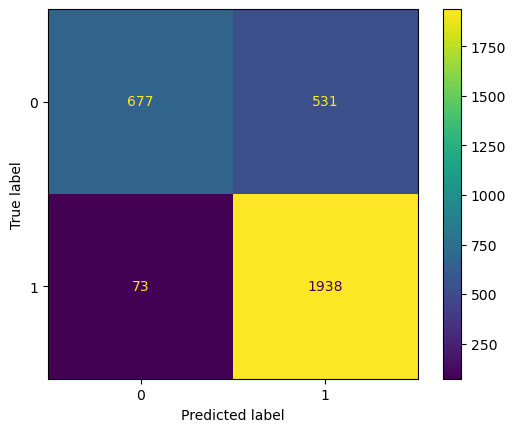

In [308]:
# Visualize a confusion matrix
cm = metrics.confusion_matrix(y_test, y_p, labels=lr_model.classes_)
disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=lr_model.classes_)
disp.plot()

In [309]:
print('Accuracy:', '%.3f' % accuracy_score(y_test, y_p))
print('Precision:', '%.3f' % precision_score(y_test, y_p))
print('Recall:', '%.3f' % recall_score(y_test, y_p))
print('F1 Score:', '%.3f' % f1_score(y_test, y_p))

Accuracy: 0.812
Precision: 0.785
Recall: 0.964
F1 Score: 0.865


In [164]:
# Generate the model evaluation results df for comparison
results_df = add_model_results(results_df,'Model D: Logistic Regression', 0.812, 0.785, 0.964, 0.865)
print(results_df)

                          Model  Accuracy  Precision  Recall  F1 Score
0          Model A: Naive Bayes     0.811      0.793   0.943     0.861
1        Model B: Decision Tree     0.695      0.754   0.759     0.757
2        Model C: Random Forest     0.786      0.759   0.964     0.849
3  Model D: Logistic Regression     0.812      0.785   0.964     0.865


/var/folders/rb/4qzqvc_x3jbczj9trv7ddnjw0000gn/T/ipykernel_33637/1708188469.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append(new_row, ignore_index=True)


## The Naive Bayes & Logistic Regression models performed the best, with precision being slightly higher with Naive Bayes while F1 Score, Recall, and Accuracy scores were higher with Logistic Regression. As a result, we choose the Logistic Regression model as our champion, due to the higher F1 score.

In [ ]:
## Create Final DF with 2 columns - patient_id & predicted probability

In [315]:
# Read in and preview the final test
test = pd.read_csv('test.csv')
test.head()

,patient_id,patient_race,payer_type,patient_state,patient_zip3,patient_age,patient_gender,bmi,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,...,hispanic,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Ozone,PM25,N02
0,573710,White,MEDICAID,IN,467,54,F,NaN,C50412,Malig neoplasm of upper-outer quadrant of left...,...,3.564516,13.996774,7.985484,0.969355,24.955357,10.838710,8.080645,38.724876,7.947165,11.157161
1,593679,NaN,COMMERCIAL,FL,337,52,F,NaN,C50912,Malignant neoplasm of unspecified site of left...,...,10.261538,16.020513,13.602564,2.836842,23.952632,10.579487,9.302564,36.918257,7.838973,13.599985
2,184532,Hispanic,MEDICAID,CA,917,61,F,NaN,C50911,Malignant neoplasm of unsp site of right femal...,...,47.726087,9.895652,10.515217,12.745652,32.530435,7.263043,3.810870,47.310325,9.595719,20.084231
3,447383,Hispanic,MEDICARE ADVANTAGE,CA,917,64,F,NaN,C50912,Malignant neoplasm of unspecified site of left...,...,47.726087,9.895652,10.515217,12.745652,32.530435,7.263043,3.810870,47.310325,9.595719,20.084231
4,687972,Black,NaN,CA,900,40,F,23.0,C50412,Malig neoplasm of upper-outer quadrant of left...,...,45.526154,11.901538,20.760000,14.737500,30.709375,10.341538,3.030769,41.186992,11.166898,21.644261


In [316]:
# Which columns are in this dataset? - No target
test.columns

Index(['patient_id', 'patient_race', 'payer_type', 'patient_state',
       'patient_zip3', 'patient_age', 'patient_gender', 'bmi',
       'breast_cancer_diagnosis_code', 'breast_cancer_diagnosis_desc',
       'metastatic_cancer_diagnosis_code', 'metastatic_first_novel_treatment',
       'metastatic_first_novel_treatment_type', 'Region', 'Division',
       'population', 'density', 'age_median', 'age_under_10', 'age_10_to_19',
       'age_20s', 'age_30s', 'age_40s', 'age_50s', 'age_60s', 'age_70s',
       'age_over_80', 'male', 'female', 'married', 'divorced', 'never_married',
       'widowed', 'family_size', 'family_dual_income',
       'income_household_median', 'income_household_under_5',
       'income_household_5_to_10', 'income_household_10_to_15',
       'income_household_15_to_20', 'income_household_20_to_25',
       'income_household_25_to_35', 'income_household_35_to_50',
       'income_household_50_to_75', 'income_household_75_to_100',
       'income_household_100_to_150', 'in

In [317]:
# Check for missing values
test.isna().sum()

patient_id             0
patient_race        2901
payer_type           760
patient_state         21
patient_zip3           0
                    ... 
health_uninsured       0
veteran                0
Ozone                 14
PM25                  14
N02                   14
Length: 82, dtype: int64

## Preprocess the final test data set

In [318]:
# Drop unnecessary features  
test_prepped = test.drop(['patient_id', 'patient_race', 'bmi', 
                          'metastatic_first_novel_treatment', 
                          'metastatic_first_novel_treatment_type', 
                          'patient_gender', 'female', 'male'], axis=1)

# Encode categoricals as dummies
encoded_test = pd.get_dummies(test_prepped, drop_first='True')
encoded_test


,patient_zip3,patient_age,population,density,age_median,age_under_10,age_10_to_19,age_20s,age_30s,age_40s,...,Region_South,Region_West,Division_East South Central,Division_Middle Atlantic,Division_Mountain,Division_New England,Division_Pacific,Division_South Atlantic,Division_West North Central,Division_West South Central
0,467,54,5441.435484,85.620968,40.880328,12.732258,14.088710,10.659677,11.625806,11.208065,...,0,0,0,0,0,0,0,0,0,0
1,337,52,19613.820510,1555.107692,49.107692,8.069231,8.587179,10.684615,11.302564,10.971795,...,1,0,0,0,0,0,0,1,0,0
2,917,61,43030.500000,2048.578261,38.852174,11.306522,12.897826,14.121739,13.532609,13.160870,...,0,1,0,0,0,0,1,0,0,0
3,917,64,43030.500000,2048.578261,38.852174,11.306522,12.897826,14.121739,13.532609,13.160870,...,0,1,0,0,0,0,1,0,0,0
4,900,40,36054.117650,5294.330882,36.653846,9.761538,11.267692,17.233846,17.441538,13.090769,...,0,1,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5787,404,63,7765.000000,131.040000,40.434783,11.556522,14.021739,13.208696,11.160870,13.191304,...,1,0,1,0,0,0,0,0,0,0
5788,507,69,19332.750000,346.250000,38.525000,12.200000,13.025000,14.675000,12.750000,10.975000,...,0,0,0,0,0,0,0,0,1,0
5789,980,84,28628.290910,1091.825455,39.679245,12.143396,12.462264,11.320755,15.213208,14.449057,...,0,1,0,0,0,0,1,0,0,0
5790,740,58,9716.970149,150.602985,39.588060,11.768657,15.576119,12.500000,11.220896,12.462687,...,1,0,0,0,0,0,0,0,0,1


In [319]:
# Check for missing values
encoded_test.isna().sum()

patient_zip3                   0
patient_age                    0
population                     0
density                        0
age_median                     0
                              ..
Division_New England           0
Division_Pacific               0
Division_South Atlantic        0
Division_West North Central    0
Division_West South Central    0
Length: 250, dtype: int64

In [320]:
# Keep only the top 20 most import features
X = encoded_test[['patient_age', 'breast_cancer_diagnosis_code_1749', 'breast_cancer_diagnosis_code_1744', 'breast_cancer_diagnosis_code_1748', 'metastatic_cancer_diagnosis_code_C773','veteran', 'disabled', 'breast_cancer_diagnosis_code_1745', 'unemployment_rate', 'breast_cancer_diagnosis_desc_Malignant neoplasm of central portion of female breast', 'breast_cancer_diagnosis_code_1742', 'race_multiple', 'PM25', 'Ozone', 'self_employed','health_uninsured', 'patient_zip3', 'income_household_100_to_150', 'income_household_25_to_35', 'metastatic_cancer_diagnosis_code_C7981']]

In [321]:
# Troubleshooting - check for hints of extreme class imbalance
X['breast_cancer_diagnosis_code_1749'].value_counts()

0    4886
1     906
Name: breast_cancer_diagnosis_code_1749, dtype: int64

In [322]:
# Impute missing values left in PM25, Ozone etc
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='median')  
X_imputed= imputer.fit_transform(X) 


X_imputed.shape

(5792, 20)

In [323]:
# Scale the final data the same way the model was build so the input matches
X_final = scaler.transform(X_imputed)

/Users/bethelhagos/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [324]:
# Get predictions of DiagPeriodL90D positive
predicted_probabilities = lr_model.predict_proba(X_final)[:, 1]

## Get predicted probabilities

In [325]:
# Make a new DataFrame for the results
results_data = {
    'patient_id': test['patient_id'],
    'DiagPeriodL90D_proba': predicted_probabilities
}

In [326]:
submission = pd.DataFrame(results_data)
print(submission)

      patient_id  DiagPeriodL90D_proba
0         573710              0.768678
1         593679              0.747027
2         184532              0.802055
3         447383              0.799818
4         687972              0.776154
...          ...                   ...
5787      977076              0.818922
5788      922960              0.831646
5789      759690              0.873400
5790      911717              0.080187
5791      327597              0.796609

[5792 rows x 2 columns]


In [327]:
submission.to_csv('submission_WiDS_San_Diego_FirstKaggle_Student_BKH_SS_KG.csv', index=False)